In [129]:
from requests import Request, Session
from requests.exceptions import ConnectionError, Timeout, TooManyRedirects
import json

url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/listings/latest'
parameters = {
  'start':'1',
  'limit':'1000',
  'convert':'USD'
}
headers = {
  'Accepts': 'application/json',
  'X-CMC_PRO_API_KEY': '4290ed6d-b24f-4da6-8841-ddeaab80a187',
}

session = Session()
session.headers.update(headers)

try:
  response = session.get(url, params=parameters)
  data = json.loads(response.text)
  print(data)
except (ConnectionError, Timeout, TooManyRedirects) as e:
  print(e)
  

{'status': {'timestamp': '2023-12-13T03:03:04.287Z', 'error_code': 0, 'error_message': None, 'elapsed': 31, 'credit_count': 5, 'notice': None, 'total_count': 8882}, 'data': [{'id': 1, 'name': 'Bitcoin', 'symbol': 'BTC', 'slug': 'bitcoin', 'num_market_pairs': 10616, 'date_added': '2010-07-13T00:00:00.000Z', 'tags': ['mineable', 'pow', 'sha-256', 'store-of-value', 'state-channel', 'coinbase-ventures-portfolio', 'three-arrows-capital-portfolio', 'polychain-capital-portfolio', 'binance-labs-portfolio', 'blockchain-capital-portfolio', 'boostvc-portfolio', 'cms-holdings-portfolio', 'dcg-portfolio', 'dragonfly-capital-portfolio', 'electric-capital-portfolio', 'fabric-ventures-portfolio', 'framework-ventures-portfolio', 'galaxy-digital-portfolio', 'huobi-capital-portfolio', 'alameda-research-portfolio', 'a16z-portfolio', '1confirmation-portfolio', 'winklevoss-capital-portfolio', 'usv-portfolio', 'placeholder-ventures-portfolio', 'pantera-capital-portfolio', 'multicoin-capital-portfolio', 'para

In [130]:
type(data)

dict

In [131]:
import pandas as pd

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [132]:
df = pd.json_normalize(data['data'])
df['timestamp'] = pd.to_datetime('now', utc='True')
df

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,1,Bitcoin,BTC,bitcoin,10616,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",21000000.000000,19568337.000000,19568337.000000,False,NaN,1,NaN,NaN,NaN,2023-12-13T03:02:00.000Z,40980.588866,24895481038.728325,-30.248800,-0.280070,-1.989857,-6.622010,10.267697,52.263177,55.939008,801921973385.368652,52.000700,860592366182.819946,NaN,2023-12-13T03:02:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-13 03:03:07.564573+00:00
1,1027,Ethereum,ETH,ethereum,8025,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,120211761.826141,120211761.826141,True,NaN,2,NaN,NaN,NaN,2023-12-13T03:02:00.000Z,2173.252971,11680111623.484491,-23.931900,-0.229704,-2.723017,-5.145498,5.260810,39.803941,33.860003,261250568529.404694,16.954500,261250568529.399994,NaN,2023-12-13T03:02:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-13 03:03:07.564573+00:00
2,825,Tether USDt,USDT,tether,67948,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,90653779562.346848,93609080552.592239,True,NaN,3,NaN,NaN,NaN,2023-12-13T03:01:00.000Z,0.999734,51711676275.140518,-20.107900,-0.009026,0.007077,-0.051855,-0.098332,-0.026555,-0.047224,90629693292.760437,5.883300,93584209073.869995,NaN,2023-12-13T03:01:00.000Z,1027.000000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2023-12-13 03:03:07.564573+00:00
3,1839,BNB,BNB,bnb,1836,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,151696292.960912,151696292.960912,False,NaN,4,NaN,NaN,NaN,2023-12-13T03:01:00.000Z,249.536672,1417485673.639225,0.513400,-0.232451,-1.232946,7.493093,0.194284,20.806833,17.469075,37853788166.477478,2.455800,37853788166.480003,NaN,2023-12-13T03:01:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-13 03:03:07.564573+00:00
4,52,XRP,XRP,xrp,1170,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, arr...",100000000000.000000,53957460767.000000,99988170772.000000,False,NaN,5,NaN,NaN,NaN,2023-12-13T03:02:00.000Z,0.609913,1467784561.542973,-20.128600,-0.211947,-2.356893,-2.186528,-8.376505,25.732824,25.889888,32909329948.818199,2.135000,60991250294.239998,NaN,2023-12-13T03:02:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-13 03:03:07.564573+00:00
5,5426,Solana,SOL,solana,559,2020-04-10T00:00:00.000Z,"[pos, platform, solana-ecosystem, cms-holdings...",NaN,426406080.449229,564704067.914110,True,NaN,6,NaN,NaN,NaN,2023-12-13T03:02:00.000Z,66.923076,2324540861.437525,-29.096100,0.448335,-6.089013,5.265335,14.843618,204.494139,253.283254,28536406341.574638,1.851900,37791733006.620003,NaN,2023-12-13T03:02:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-13 03:03:07.564573+00:00
6,3408,USDC,USDC,usd-coin,15499,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,24067795476.003448,24067795476.003448,False,NaN,7,NaN,NaN,NaN,2023-12-13T03:02:00.000Z,1.000301,6393742481.288685,-22.099100,0.009549,0.006580,-0.001608,0.040313,0.005433,0.028578,24075046354.759975,1.562400,24075046354.759998,NaN,2023-12-13T03:02:00.000Z,1027.000000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2023-12-13 03:03:07.564573+00:00
7,2010,Cardano,ADA,cardano,998,2017-10-01T00:00:00.000Z,"[dpos, pos, platform, research, smart-contract...",45000000000.000000,35327644990.021004,36439975031.086998,False,NaN,8,NaN,NaN,NaN,2023-12-13T03:01:00.000Z,0.561336,1253266093.172

In [133]:
import os
from requests import Request, Session
from requests.exceptions import ConnectionError, Timeout, TooManyRedirects
import json
import pandas as pd

# Global DataFrame
# df = pd.DataFrame()

# Function to call API
def api_runner():
    url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/listings/latest'
    parameters = {
        'start': '1',
        'limit': '15',
        'convert': 'USD'
    }
    headers = {
        'Accepts': 'application/json',
        'X-CMC_PRO_API_KEY': '4290ed6d-b24f-4da6-8841-ddeaab80a187',
    }

    session = Session()
    session.headers.update(headers)

    try:
        response = session.get(url, params=parameters)
        data = json.loads(response.text)
    except (ConnectionError, Timeout, TooManyRedirects) as e:
        print(e)

        
        # Append DataFrame 2 and pin to the original DataFrame
#         df2 = pd.json_normalize(data['data'])
#         df2['timestamp'] = pd.to_datetime('now', utc=True)
#         df_append = pd.DataFrame(df2)
#         df = pd.concat([df,df_append])
        
        df = pd.json_normalize(data['data'])
        df['timestamp'] = pd.to_datetime('now', utc=True)
        df

        if not os.path.isfile(r'C:\Users\Jordan\Desktop\Projects\Data Analyst\Python\API.csv'):
            df.to_csv(r'C:\Users\Jordan\Desktop\Projects\Data Analyst\Python\API.csv', header='column_names')
        else:
            df.to_csv(r'C:\Users\Jordan\Desktop\Projects\Data Analyst\Python\API.csv', mode='a', header=False)
        
        return data


In [6]:
# Creating a loop to test the API runner
import os
from time import time
from time import sleep

for i in range(333):
    api_data = api_runner()
    print('API Runner Completed')
    sleep(60)  # Sleep for 1 minute
exit()

API Runner Completed


KeyboardInterrupt: 

In [134]:
df72 = pd.read_csv(r'C:\Users\Jordan\Desktop\Projects\Data Analyst\Python\API.csv')
df72

,Unnamed: 0,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,0,1,Bitcoin,BTC,bitcoin,10616,2010-07-13T00:00:00.000Z,"['mineable', 'pow', 'sha-256', 'store-of-value...",21000000.000000,19567187.000000,19567187.000000,False,NaN,1,NaN,NaN,NaN,2023-12-11T22:08:00.000Z,41209.987121,39947909904.153191,202.816400,0.637176,-6.012440,-1.893003,11.530290,54.118172,58.347926,806363524258.081421,51.933600,865409729534.430054,NaN,2023-12-11T22:08:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-11 22:09:26.249564+00:00
1,1,1027,Ethereum,ETH,ethereum,8011,2015-08-07T00:00:00.000Z,"['pos', 'smart-contracts', 'ethereum-ecosystem...",NaN,120215621.816134,120215621.816134,True,NaN,2,NaN,NaN,NaN,2023-12-11T22:08:00.000Z,2216.358400,17799310966.703423,137.144800,0.679473,-6.227595,-0.769790,8.429562,44.223412,38.584258,266440903206.929596,17.172600,266440903206.929993,NaN,2023-12-11T22:08:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-11 22:09:26.249564+00:00
2,2,825,Tether USDt,USDT,tether,67829,2015-02-25T00:00:00.000Z,"['payments', 'stablecoin', 'asset-backed-stabl...",NaN,90545444292.787476,92609080553.052856,True,NaN,3,NaN,NaN,NaN,2023-12-11T22:07:00.000Z,0.999435,73347374372.918030,120.203000,0.020815,-0.052213,0.000283,-0.070553,-0.037539,-0.049442,90494300080.194046,5.829900,92556770704.220001,NaN,2023-12-11T22:07:00.000Z,1027.000000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2023-12-11 22:09:26.249564+00:00
3,3,1839,BNB,BNB,bnb,1832,2017-07-25T00:00:00.000Z,"['marketplace', 'centralized-exchange', 'payme...",NaN,151696535.530012,151696535.530012,False,NaN,4,NaN,NaN,NaN,2023-12-11T22:07:00.000Z,242.780514,1416871278.780594,118.758600,0.066800,1.169955,4.791735,-3.207758,18.154706,14.419451,36828962932.037949,2.373200,36828962932.040001,NaN,2023-12-11T22:07:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-11 22:09:26.249564+00:00
4,4,52,XRP,XRP,xrp,1170,2013-08-04T00:00:00.000Z,"['medium-of-exchange', 'enterprise-solutions',...",100000000000.000000,53957460767.000000,99988170772.000000,False,NaN,5,NaN,NaN,NaN,2023-12-11T22:08:00.000Z,0.618904,2225865885.512024,75.659600,0.554330,-6.793570,-0.764860,-6.785449,28.039542,28.251019,33394510819.364807,2.151400,61890441738.110001,NaN,2023-12-11T22:08:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-11 22:09:26.249564+00:00
5,5,5426,Solana,SOL,solana,559,2020-04-10T00:00:00.000Z,"['pos', 'platform', 'solana-ecosystem', 'cms-h...",NaN,426247064.829780,564531619.804407,True,NaN,6,NaN,NaN,NaN,2023-12-11T22:08:00.000Z,69.379328,3690619520.849266,92.371700,-0.857218,-6.288218,12.583014,19.598529,226.990990,286.396383,29572735107.743134,1.905000,39166824665.610001,NaN,2023-12-11T22:08:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-11 22:09:26.249564+00:00
6,6,3408,USDC,USDC,usd-coin,15426,2018-10-08T00:00:00.000Z,"['medium-of-exchange', 'stablecoin', 'asset-ba...",NaN,24281909013.284336,24281909013.284336,False,NaN,7,NaN,NaN,NaN,2023-12-11T22:08:00.000Z,1.000453,8948147591.577168,144.486900,0.040143,0.035274,0.055153,0.057866,0.016003,0.010249,24292904274.853951,1.565000,24292904274.849998,NaN,2023-12-11T22:08:00.000Z,1027.000000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2023-12-11 22:09:26.249564+00:00
7,7,2010,Cardano,ADA,cardano,997,2017-10-01T00:00:00.000Z,"['dpos', 'pos', 'platform', 'research', 'smart...",45000000000.000000,35327686064.836998,36424942625.351997,False,NaN,8,NaN,NaN,NaN,2023-12-11T22:07:00.000Z,

In [135]:
df

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,1,Bitcoin,BTC,bitcoin,10616,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",21000000.000000,19568337.000000,19568337.000000,False,NaN,1,NaN,NaN,NaN,2023-12-13T03:02:00.000Z,40980.588866,24895481038.728325,-30.248800,-0.280070,-1.989857,-6.622010,10.267697,52.263177,55.939008,801921973385.368652,52.000700,860592366182.819946,NaN,2023-12-13T03:02:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-13 03:03:07.564573+00:00
1,1027,Ethereum,ETH,ethereum,8025,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,120211761.826141,120211761.826141,True,NaN,2,NaN,NaN,NaN,2023-12-13T03:02:00.000Z,2173.252971,11680111623.484491,-23.931900,-0.229704,-2.723017,-5.145498,5.260810,39.803941,33.860003,261250568529.404694,16.954500,261250568529.399994,NaN,2023-12-13T03:02:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-13 03:03:07.564573+00:00
2,825,Tether USDt,USDT,tether,67948,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,90653779562.346848,93609080552.592239,True,NaN,3,NaN,NaN,NaN,2023-12-13T03:01:00.000Z,0.999734,51711676275.140518,-20.107900,-0.009026,0.007077,-0.051855,-0.098332,-0.026555,-0.047224,90629693292.760437,5.883300,93584209073.869995,NaN,2023-12-13T03:01:00.000Z,1027.000000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2023-12-13 03:03:07.564573+00:00
3,1839,BNB,BNB,bnb,1836,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,151696292.960912,151696292.960912,False,NaN,4,NaN,NaN,NaN,2023-12-13T03:01:00.000Z,249.536672,1417485673.639225,0.513400,-0.232451,-1.232946,7.493093,0.194284,20.806833,17.469075,37853788166.477478,2.455800,37853788166.480003,NaN,2023-12-13T03:01:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-13 03:03:07.564573+00:00
4,52,XRP,XRP,xrp,1170,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, arr...",100000000000.000000,53957460767.000000,99988170772.000000,False,NaN,5,NaN,NaN,NaN,2023-12-13T03:02:00.000Z,0.609913,1467784561.542973,-20.128600,-0.211947,-2.356893,-2.186528,-8.376505,25.732824,25.889888,32909329948.818199,2.135000,60991250294.239998,NaN,2023-12-13T03:02:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-13 03:03:07.564573+00:00
5,5426,Solana,SOL,solana,559,2020-04-10T00:00:00.000Z,"[pos, platform, solana-ecosystem, cms-holdings...",NaN,426406080.449229,564704067.914110,True,NaN,6,NaN,NaN,NaN,2023-12-13T03:02:00.000Z,66.923076,2324540861.437525,-29.096100,0.448335,-6.089013,5.265335,14.843618,204.494139,253.283254,28536406341.574638,1.851900,37791733006.620003,NaN,2023-12-13T03:02:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-13 03:03:07.564573+00:00
6,3408,USDC,USDC,usd-coin,15499,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,24067795476.003448,24067795476.003448,False,NaN,7,NaN,NaN,NaN,2023-12-13T03:02:00.000Z,1.000301,6393742481.288685,-22.099100,0.009549,0.006580,-0.001608,0.040313,0.005433,0.028578,24075046354.759975,1.562400,24075046354.759998,NaN,2023-12-13T03:02:00.000Z,1027.000000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2023-12-13 03:03:07.564573+00:00
7,2010,Cardano,ADA,cardano,998,2017-10-01T00:00:00.000Z,"[dpos, pos, platform, research, smart-contract...",45000000000.000000,35327644990.021004,36439975031.086998,False,NaN,8,NaN,NaN,NaN,2023-12-13T03:01:00.000Z,0.561336,1253266093.172

In [136]:
pd.set_option('display.float_format', lambda x: '%5f' % x)

In [137]:
df

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,1,Bitcoin,BTC,bitcoin,10616,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",21000000.000000,19568337.000000,19568337.000000,False,NaN,1,NaN,NaN,NaN,2023-12-13T03:02:00.000Z,40980.588866,24895481038.728325,-30.248800,-0.280070,-1.989857,-6.622010,10.267697,52.263177,55.939008,801921973385.368652,52.000700,860592366182.819946,NaN,2023-12-13T03:02:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-13 03:03:07.564573+00:00
1,1027,Ethereum,ETH,ethereum,8025,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,120211761.826141,120211761.826141,True,NaN,2,NaN,NaN,NaN,2023-12-13T03:02:00.000Z,2173.252971,11680111623.484491,-23.931900,-0.229704,-2.723017,-5.145498,5.260810,39.803941,33.860003,261250568529.404694,16.954500,261250568529.399994,NaN,2023-12-13T03:02:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-13 03:03:07.564573+00:00
2,825,Tether USDt,USDT,tether,67948,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,90653779562.346848,93609080552.592239,True,NaN,3,NaN,NaN,NaN,2023-12-13T03:01:00.000Z,0.999734,51711676275.140518,-20.107900,-0.009026,0.007077,-0.051855,-0.098332,-0.026555,-0.047224,90629693292.760437,5.883300,93584209073.869995,NaN,2023-12-13T03:01:00.000Z,1027.000000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2023-12-13 03:03:07.564573+00:00
3,1839,BNB,BNB,bnb,1836,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,151696292.960912,151696292.960912,False,NaN,4,NaN,NaN,NaN,2023-12-13T03:01:00.000Z,249.536672,1417485673.639225,0.513400,-0.232451,-1.232946,7.493093,0.194284,20.806833,17.469075,37853788166.477478,2.455800,37853788166.480003,NaN,2023-12-13T03:01:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-13 03:03:07.564573+00:00
4,52,XRP,XRP,xrp,1170,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, arr...",100000000000.000000,53957460767.000000,99988170772.000000,False,NaN,5,NaN,NaN,NaN,2023-12-13T03:02:00.000Z,0.609913,1467784561.542973,-20.128600,-0.211947,-2.356893,-2.186528,-8.376505,25.732824,25.889888,32909329948.818199,2.135000,60991250294.239998,NaN,2023-12-13T03:02:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-13 03:03:07.564573+00:00
5,5426,Solana,SOL,solana,559,2020-04-10T00:00:00.000Z,"[pos, platform, solana-ecosystem, cms-holdings...",NaN,426406080.449229,564704067.914110,True,NaN,6,NaN,NaN,NaN,2023-12-13T03:02:00.000Z,66.923076,2324540861.437525,-29.096100,0.448335,-6.089013,5.265335,14.843618,204.494139,253.283254,28536406341.574638,1.851900,37791733006.620003,NaN,2023-12-13T03:02:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-12-13 03:03:07.564573+00:00
6,3408,USDC,USDC,usd-coin,15499,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,24067795476.003448,24067795476.003448,False,NaN,7,NaN,NaN,NaN,2023-12-13T03:02:00.000Z,1.000301,6393742481.288685,-22.099100,0.009549,0.006580,-0.001608,0.040313,0.005433,0.028578,24075046354.759975,1.562400,24075046354.759998,NaN,2023-12-13T03:02:00.000Z,1027.000000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2023-12-13 03:03:07.564573+00:00
7,2010,Cardano,ADA,cardano,998,2017-10-01T00:00:00.000Z,"[dpos, pos, platform, research, smart-contract...",45000000000.000000,35327644990.021004,36439975031.086998,False,NaN,8,NaN,NaN,NaN,2023-12-13T03:01:00.000Z,0.561336,1253266093.172

In [138]:
df3 = df.groupby('name', sort=False)[['quote.USD.percent_change_1h', 'quote.USD.percent_change_24h', 'quote.USD.percent_change_7d', 'quote.USD.percent_change_30d', 'quote.USD.percent_change_60d', 'quote.USD.percent_change_90d']].mean()
df3

,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d
name,,,,,,
Bitcoin,-0.280070,-1.989857,-6.622010,10.267697,52.263177,55.939008
Ethereum,-0.229704,-2.723017,-5.145498,5.260810,39.803941,33.860003
Tether USDt,-0.009026,0.007077,-0.051855,-0.098332,-0.026555,-0.047224
BNB,-0.232451,-1.232946,7.493093,0.194284,20.806833,17.469075
XRP,-0.211947,-2.356893,-2.186528,-8.376505,25.732824,25.889888
Solana,0.448335,-6.089013,5.265335,14.843618,204.494139,253.283254
USDC,0.009549,0.006580,-0.001608,0.040313,0.005433,0.028578
Cardano,-0.348060,-0.089435,32.268475,46.003126,127.805352,125.603054
Dogecoin,-0.511305,-4.895236,-2.854161,16.579310,56.735735,49.777893


In [139]:
df4 = df3.stack()
df4

name                                                                  
Bitcoin                                   quote.USD.percent_change_1h          -0.280070
                                          quote.USD.percent_change_24h         -1.989857
                                          quote.USD.percent_change_7d          -6.622010
                                          quote.USD.percent_change_30d         10.267697
                                          quote.USD.percent_change_60d         52.263177
                                          quote.USD.percent_change_90d         55.939008
Ethereum                                  quote.USD.percent_change_1h          -0.229704
                                          quote.USD.percent_change_24h         -2.723017
                                          quote.USD.percent_change_7d          -5.145498
                                          quote.USD.percent_change_30d          5.260810
                                       

In [140]:
type(df4)

pandas.core.series.Series

In [141]:
df5 = df4.to_frame(name='values')
df5

values
name                                                                                 
Bitcoin                                  quote.USD.percent_change_1h        -0.280070
                                         quote.USD.percent_change_24h       -1.989857
                                         quote.USD.percent_change_7d        -6.622010
                                         quote.USD.percent_change_30d       10.267697
                                         quote.USD.percent_change_60d       52.263177
                                         quote.USD.percent_change_90d       55.939008
Ethereum                                 quote.USD.percent_change_1h        -0.229704
                                         quote.USD.percent_change_24h       -2.723017
                                         quote.USD.percent_change_7d        -5.145498
                                         quote.USD.percent_change_30d        5.260810
                                         quote.USD.percent_change_60d       39.803941
                                         quote.USD.percent_change_90d       33.860003
Tether USDt                              quote.USD.percent_change_1h        -0.009026
                                         quote.USD.percent_change_24h        0.007077
                                         quote.USD.percent_change_7d        -0.051855
                                         quote.USD.percent_change_30d       -0.098332
                                         quote.USD.percent_change_60d       -0.026555
                                         quote.USD.percent_change_90d       -0.047224
BNB                                      quote.USD.percent_change_1h        -0.232451
                                         quote.USD.percent_change_24h       -1.232946
                                         quote.USD.percent_change_7d         7.493093
                                         quote.USD.percent_change_30d        0.194284
                                         quote.USD.percent_change_60d       20.806833
                                         quote.USD.percent_change_90d       17.469075
XRP                                      quote.USD.percent_change_1h        -0.211947
                                         quote.USD.percent_change_24h       -2.356893
                                         quote.USD.percent_change_7d        -2.186528
                                         quote.USD.percent_change_30d       -8.376505
                                         quote.USD.percent_change_60d       25.732824
                                         quote.USD.percent_change_90d       25.889888
Solana                                   quote.USD.percent_change_1h         0.448335
                                         quote.USD.percent_change_24h       -6.089013
                                         quote.USD.percent_change_7d         5.265335
                                         quote.USD.percent_change_30d       14.843618
                                         quote.USD.percent_change_60d      204.494139
                                         quote.USD.percent_change_90d      253.283254
USDC                                     quote.USD.percent_change_1h         0.009549
                                         quote.USD.percent_change_24h        0.006580
                                         quote.USD.percent_change_7d        -0.001608
                                         quote.USD.percent_change_30d        0.040313
                                         quote.USD.percent_change_60d        0.005433
                                         quote.USD.percent_change_90d        0.028578
Cardano                                  quote.USD.percent_change_1h        -0.348060
                                         quote.USD.percent_change_24h       -0.089435
                                         quote.USD.percent_change_7d        32.268475
                                     

In [142]:
df5.count()

values    5982
dtype: int64

In [16]:
index = pd.Index(range(90))

df6 = df5.reset_index()
df6

,name,level_1,values
0,Bitcoin,quote.USD.percent_change_1h,-0.641361
1,Bitcoin,quote.USD.percent_change_24h,-1.476061
2,Bitcoin,quote.USD.percent_change_7d,-6.650933
3,Bitcoin,quote.USD.percent_change_30d,10.118601
4,Bitcoin,quote.USD.percent_change_60d,52.972224
...,...,...,...
85,Toncoin,quote.USD.percent_change_24h,-4.819277
86,Toncoin,quote.USD.percent_change_7d,-14.747873
87,Toncoin,quote.USD.percent_change_30d,-17.755863
88,Toncoin,quote.USD.percent_change_60d,6.349756


In [17]:
df7 = df6.rename(columns={'level_1': 'percent_change'})
df7

,name,percent_change,values
0,Bitcoin,quote.USD.percent_change_1h,-0.641361
1,Bitcoin,quote.USD.percent_change_24h,-1.476061
2,Bitcoin,quote.USD.percent_change_7d,-6.650933
3,Bitcoin,quote.USD.percent_change_30d,10.118601
4,Bitcoin,quote.USD.percent_change_60d,52.972224
...,...,...,...
85,Toncoin,quote.USD.percent_change_24h,-4.819277
86,Toncoin,quote.USD.percent_change_7d,-14.747873
87,Toncoin,quote.USD.percent_change_30d,-17.755863
88,Toncoin,quote.USD.percent_change_60d,6.349756


In [22]:
df7['percent_change'] =  df7['percent_change'].replace(['quote.USD.percent_change_1h', 'quote.USD.percent_change_24h','quote.USD.percent_change_7d','quote.USD.percent_change_30d','quote.USD.percent_change_60d','quote.USD.percent_change_90d'],['1h', '24h', '7d', '30d', '60d', '90d'])
df7

,name,percent_change,values
0,Bitcoin,1h,-0.641361
1,Bitcoin,24h,-1.476061
2,Bitcoin,7d,-6.650933
...,...,...,...
87,Toncoin,30d,-17.755863
88,Toncoin,60d,6.349756
89,Toncoin,90d,7.373997


In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

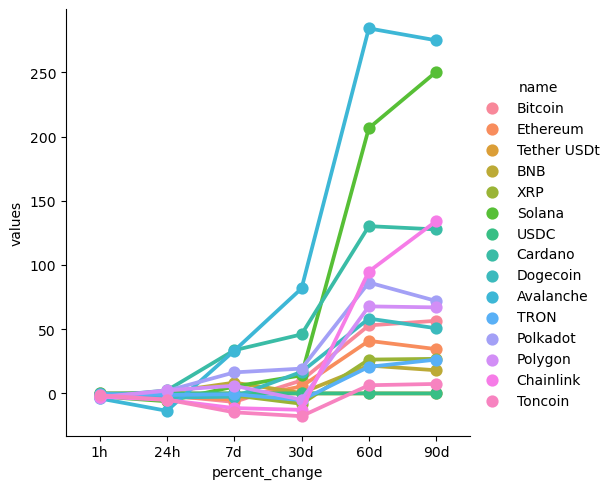

In [24]:
sns.catplot(x='percent_change', y='values', hue='name', data=df7, kind='point')

In [25]:
df['timestamp'] = df['timestamp'].fillna(pd.to_datetime('now', utc=True))
pd.set_option('display.max_rows', 6)
print(df['timestamp'].unique())

<DatetimeArray>
['2023-12-13 01:32:49.674934+00:00']
Length: 1, dtype: datetime64[ns, UTC]


In [26]:
print(df[['name','quote.USD.price','timestamp']])


           name  quote.USD.price                        timestamp
0       Bitcoin     41070.998805 2023-12-13 01:32:49.674934+00:00
1      Ethereum      2183.763805 2023-12-13 01:32:49.674934+00:00
2   Tether USDt         0.999729 2023-12-13 01:32:49.674934+00:00
..          ...              ...                              ...
12      Polygon         0.867489 2023-12-13 01:32:49.674934+00:00
13    Chainlink        14.172562 2023-12-13 01:32:49.674934+00:00
14      Toncoin         2.066234 2023-12-13 01:32:49.674934+00:00

[15 rows x 3 columns]


In [47]:
df10 = df[['name','quote.USD.price','timestamp']]
df10 = df10.query("name == 'Solana'")
df10

,name,quote.USD.price,timestamp
5,Solana,66.540150,2023-12-13 02:18:18.660505+00:00


<Axes: xlabel='timestamp', ylabel='quote.USD.price'>

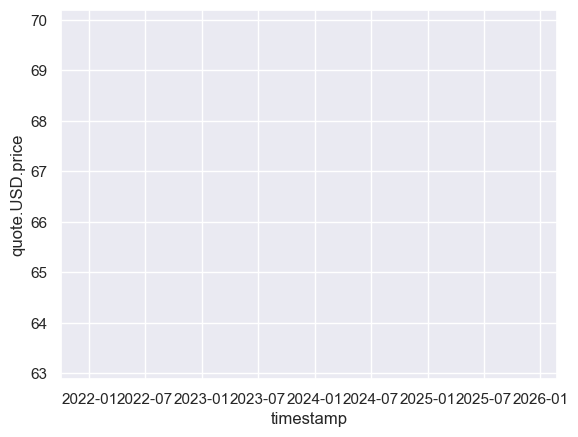

In [48]:
sns.set_theme(style="darkgrid")

sns.lineplot(x='timestamp', y='quote.USD.price', data = df10)

In [144]:
# Assuming df is your original DataFrame

# Fill NaN values in the 'tags' column with an empty string
df['tags'] = df['tags'].fillna('')

# Check if 'gaming' is present in the 'tags' column for each row
mask = df['tags'].astype(str).str.contains('gaming', case=False)

# Apply the mask to filter the DataFrame
filtered_df = df[mask]

# Display the resulting DataFrame
print(filtered_df)


        id                      name      symbol                   slug  \
29   10603                 Immutable         IMX            immutable-x   
44    5690                    Render        RNDR                 render   
59    6210               The Sandbox        SAND            the-sandbox   
64    6783             Axie Infinity         AXS          axie-infinity   
65   28298                      Beam        BEAM                 onbeam   
66    1966              Decentraland        MANA           decentraland   
71    7080                      Gala        GALA                   gala   
86   18876                   ApeCoin         APE            apecoin-ape   
124   8719                  Illuvium         ILV               illuvium   
125  10804                     FLOKI       FLOKI              floki-inu   
126  18069                       GMT         GMT  green-metaverse-token   
131   2130                Enjin Coin         ENJ             enjin-coin   
165  14783               

In [145]:
# Define selected columns and their desired names
selected_columns = {
    'name': 'Name',
    'symbol': 'Symbol',
    'tags': 'Tags',
    'quote.USD.price': 'Price',
    'quote.USD.percent_change_24h': '24h',
    'quote.USD.percent_change_1h': '1h',
    'quote.USD.percent_change_7d': '7d',
    'quote.USD.percent_change_30d': '30d',
    'quote.USD.percent_change_60d': '60d',
    'quote.USD.percent_change_90d': '90d',
    'timestamp': 'Timestamp'
}

# Display DataFrame with renamed and additional columns
display(filtered_df[selected_columns.keys()].rename(columns=selected_columns))


,Name,Symbol,Tags,Price,24h,1h,7d,30d,60d,90d,Timestamp
29,Immutable,IMX,"[collectibles-nfts, zero-knowledge-proofs, gam...",2.022043,-9.072278,-2.366666,41.290698,74.653068,289.655163,307.483552,2023-12-13 03:03:07.564573+00:00
44,Render,RNDR,"[art, media, vr-ar, ai-big-data, distributed-c...",4.093132,-0.248944,-2.555796,10.125053,68.768147,134.724462,168.894645,2023-12-13 03:03:07.564573+00:00
59,The Sandbox,SAND,"[collectibles-nfts, content-creation, gaming, ...",0.489484,-5.603079,-0.596176,7.482510,7.597358,70.114610,67.369729,2023-12-13 03:03:07.564573+00:00
64,Axie Infinity,AXS,"[collectibles-nfts, gaming, binance-launchpad,...",6.924261,-4.708696,-0.691080,-4.186137,7.024063,61.991104,62.323921,2023-12-13 03:03:07.564573+00:00
65,Beam,BEAM,"[gaming, ethereum-ecosystem, binance-chain, bi...",0.019435,1.116926,-0.623583,39.395893,131.781458,294.794615,294.794615,2023-12-13 03:03:07.564573+00:00
66,Decentraland,MANA,"[platform, collectibles-nfts, gaming, payments...",0.476013,-3.852043,-0.612957,-0.508234,-0.579096,67.773547,68.409883,2023-12-13 03:03:07.564573+00:00
71,Gala,GALA,"[collectibles-nfts, gaming, binance-smart-chai...",0.029707,-8.006990,-0.130296,-1.667677,20.095449,117.029610,107.553194,2023-12-13 03:03:07.564573+00:00
86,ApeCoin,APE,"[collectibles-nfts, content-creation, gaming, ...",1.594594,-3.594459,0.058126,-3.859899,5.864442,51.521374,37.577080,2023-12-13 03:03:07.564573+00:00
124,Illuvium,ILV,"[collectibles-nfts, gaming, dao, metaverse, pl...",94.820874,-6.856906,-0.059441,-14.776168,2.749589,138.777861,137.730828,2023-12-13 03:03:07.564573+00:00
125,FLOKI,FLOKI,"[gaming, memes, metaverse, doggone-doggerel, p...",0.000037,-2.607050,-0.863621,-11.444538,19.721650,103.291394,132.133767,2023-12-13 03:03:07.564573+00:00


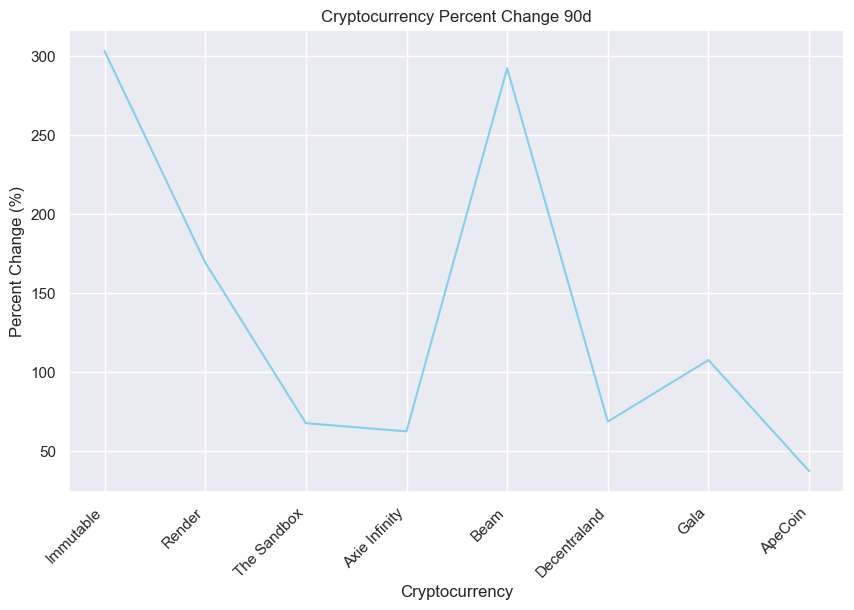

([0, 1, 2, 3, 4, 5, 6, 7],
 [Text(0, 0, 'Immutable'),
  Text(1, 0, 'Render'),
  Text(2, 0, 'The Sandbox'),
  Text(3, 0, 'Axie Infinity'),
  Text(4, 0, 'Beam'),
  Text(5, 0, 'Decentraland'),
  Text(6, 0, 'Gala'),
  Text(7, 0, 'ApeCoin')])

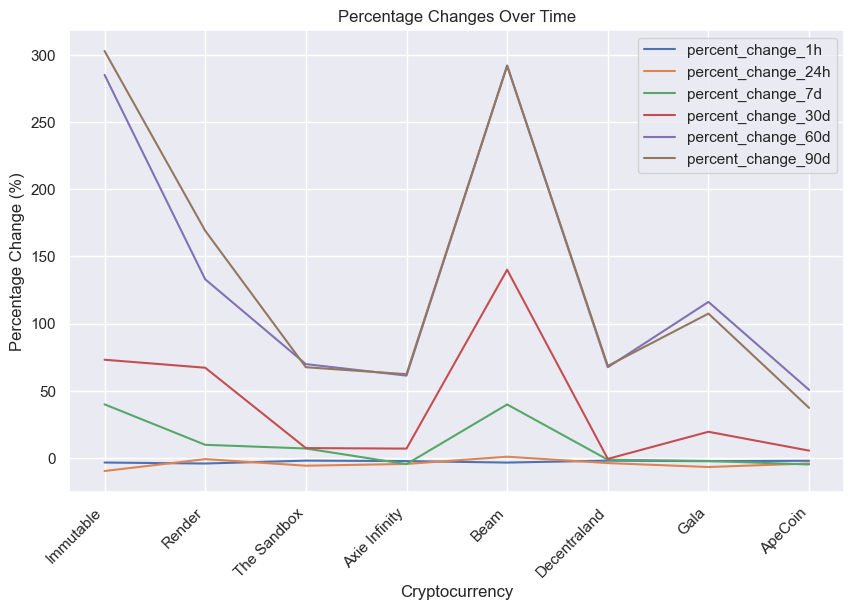

In [128]:
# Bar chart for price comparison
plt.figure(figsize=(10, 6))
plt.plot(filtered_df['name'], filtered_df['quote.USD.percent_change_90d'], color='skyblue')
plt.title('Cryptocurrency Percent Change 90d')
plt.xlabel('Cryptocurrency')
plt.ylabel('Percent Change (%)')
plt.xticks(rotation=45, ha='right')
plt.show()

# Line chart for percentage changes
percentage_changes = ['quote.USD.percent_change_1h', 'quote.USD.percent_change_24h', 'quote.USD.percent_change_7d', 'quote.USD.percent_change_30d', 'quote.USD.percent_change_60d', 'quote.USD.percent_change_90d']

plt.figure(figsize=(10, 6))
for interval in percentage_changes:
    plt.plot(filtered_df['name'], filtered_df[interval], label=interval.split('.')[-1])

plt.title('Percentage Changes Over Time')
plt.xlabel('Cryptocurrency')
plt.ylabel('Percentage Change (%)')
plt.legend()
plt.xticks(rotation=45, ha='right')


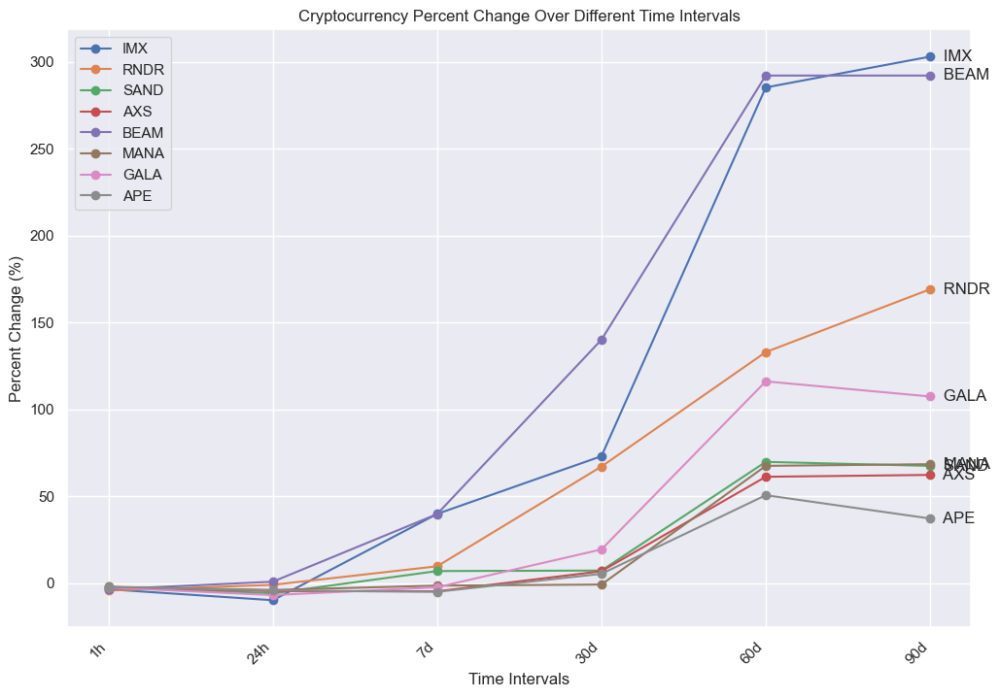

In [121]:
import matplotlib.pyplot as plt

# Define the time intervals and corresponding labels
time_intervals = ['quote.USD.percent_change_1h', 'quote.USD.percent_change_24h',
                   'quote.USD.percent_change_7d', 'quote.USD.percent_change_30d',
                   'quote.USD.percent_change_60d', 'quote.USD.percent_change_90d']
time_labels = ['1h','24h','7d', '30d', '60d', '90d']

# Renamed names
renamed_names = {'Immutable': 'IMX', 'Render': 'RNDR', 'The Sandbox': 'SAND',
                 'Axie Infinity': 'AXS', 'Beam': 'BEAM', 'Decentraland': 'MANA',
                 'Gala': 'GALA', 'ApeCoin': 'APE'}

# Set up the plot
plt.figure(figsize=(12, 8))

# Iterate through each cryptocurrency and plot a line for each time interval
for index, row in filtered_df.iterrows():
    plt.plot(time_labels, row[time_intervals], label=renamed_names.get(row['name'], row['name']), marker='o')

    # Annotate the line with the cryptocurrency name at the end of the line with some space
    plt.text(time_labels[-1], row[time_intervals[-1]], f"   {renamed_names.get(row['name'], row['name'])}", ha='left', va='center')

# Set labels and title
plt.title('Cryptocurrency Percent Change Over Different Time Intervals')
plt.xlabel('Time Intervals')
plt.ylabel('Percent Change (%)')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add legend
plt.legend()

# Show the plot
plt.show()


In [89]:
pip install plotly

In [122]:
# Making the chart interactive 


import plotly.express as px

# Define the time intervals and labels
time_intervals = ['quote.USD.percent_change_1h', 'quote.USD.percent_change_7d', 
                   'quote.USD.percent_change_30d', 'quote.USD.percent_change_60d', 'quote.USD.percent_change_90d']
time_labels = ['1h', '7d', '30d', '60d', '90d']

# Create a DataFrame with the necessary columns
plot_df = filtered_df[['name'] + time_intervals]

# Melt the DataFrame to have 'name' as the identifier variable
plot_df_melted = plot_df.melt(id_vars='name', var_name='Time Interval', value_name='Value')

# Rename the cryptocurrency names
plot_df_melted['name'] = plot_df_melted['name'].replace(renamed_names)

# Map the time intervals to the corresponding labels
plot_df_melted['Time Interval'] = plot_df_melted['Time Interval'].map(dict(zip(time_intervals, time_labels)))

# Create an interactive line chart with hover information for percent change
fig = px.line(plot_df_melted, x='Time Interval', y='Value', color='name', markers=True,
              labels={'Value': 'Percent Change (%)'},
              title='Cryptocurrency Percent Change Over Time',
              template='plotly_dark', line_shape='linear', hover_data={'Value': ':,.2f'})

# Show the plot
fig.show()


In [109]:
import plotly.express as px

# Sort the DataFrame by volume and volume change
top_volume_change_coins = df.nlargest(10, 'quote.USD.volume_change_24h')

# Create an interactive bar chart for the top 10 coins by volume change
fig_volume_change = px.bar(top_volume_change_coins, x='name', y='quote.USD.volume_change_24h',
                           title='Top 10 Coins by 24h Volume Change',
                           labels={'quote.USD.volume_change_24h': 'Volume Change (USD)'},
                           color='name')
fig_volume_change.update_layout(xaxis_title='Cryptocurrency', yaxis_title='Volume Change (USD)')

# Show the interactive charts
fig_volume_change.show()


In [148]:
# Fill NaN values in the 'tags' column with an empty string
df['tags'] = df['tags'].fillna('')

# Check if 'gaming' is present in the 'tags' column for each row
mask = df['tags'].astype(str).str.contains('gaming', case=False)

# Apply the mask to filter the DataFrame
filtered_df = df[mask]

# Sort the filtered DataFrame by volume change and select the top 10 coins
top_gaming_coins = filtered_df.nlargest(10, 'quote.USD.volume_change_24h')

# Print the names of the top 10 gaming coins
print("Top 10 Gaming Coins with Highest 24h Volume Change:")
print(top_gaming_coins[['name', 'quote.USD.volume_change_24h']])


Top 10 Gaming Coins with Highest 24h Volume Change:
                name  quote.USD.volume_change_24h
211            WEMIX                   580.417900
755            Saito                   280.805300
511            CUDOS                   159.894100
285          Chromia                   149.066900
668  Decentral Games                    85.462900
791  Captain Tsubasa                    80.408800
386    Sweat Economy                    75.595500
371  MyNeighborAlice                    74.727500
588    DeFi Kingdoms                    67.555400
649     Battle World                    55.178500


In [146]:
import plotly.express as px

# Fill NaN values in the 'tags' column with an empty string
df['tags'] = df['tags'].fillna('')

# Check if 'gaming' is present in the 'tags' column for each row
mask = df['tags'].astype(str).str.contains('gaming', case=False)

# Apply the mask to filter the DataFrame
filtered_df = df[mask]

# Sort the filtered DataFrame by volume change and select the top 10 coins
top_volume_change_gaming_coins = filtered_df.nlargest(10, 'quote.USD.volume_change_24h')

# Create an interactive bar chart for the top 10 gaming coins by volume change
fig_volume_change_gaming = px.bar(top_volume_change_gaming_coins, x='name', y='quote.USD.volume_change_24h',
                                   title='Top 10 Gaming Coins by 24h Volume Change',
                                   labels={'quote.USD.volume_change_24h': 'Volume Change (USD)'},
                                   color='name')
fig_volume_change_gaming.update_layout(xaxis_title='Cryptocurrency', yaxis_title='Volume Change (USD)')

# Show the interactive chart for gaming coins
fig_volume_change_gaming.show()


In [152]:
import plotly.express as px

# Fill NaN values in the 'tags' column with an empty string
df['tags'] = df['tags'].fillna('')

# Check if 'solana-eco' is present in the 'tags' column for each row
mask = df['tags'].astype(str).str.contains('solana-eco', case=False)

# Apply the mask to filter the DataFrame
filtered_df = df[mask]

# Sort the filtered DataFrame by volume change and select the top 10 coins
top_volume_change_solana_eco_coins = filtered_df.nlargest(10, 'quote.USD.volume_change_24h')

# Create an interactive bar chart for the top 10 solana-eco coins by volume change
fig_volume_change_solana_eco = px.bar(top_volume_change_gaming_coins, x='name', y='quote.USD.volume_change_24h',
                                   title='Top 10 Solana Ecosystem Coins by 24h Volume Change',
                                   labels={'quote.USD.volume_change_24h': 'Volume Change (USD)'},
                                   color='name')
fig_volume_change_solana_eco.update_layout(xaxis_title='Cryptocurrency', yaxis_title='Volume Change (USD)')

# Show the interactive chart for gaming coins
fig_volume_change_solana_eco.show()